## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

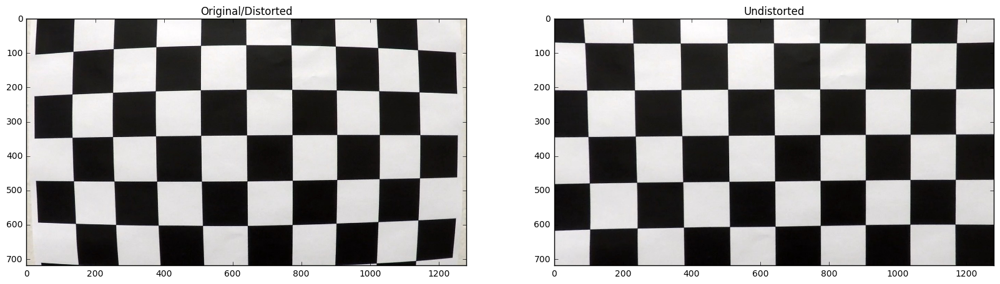

In [1]:
from camera_calibrator import CameraCalibrator

image_directory = 'camera_cal'
image_filename = 'calibration*.jpg'
binary_filename = 'binary_calibration'
camera_calibrator = CameraCalibrator(image_directory, image_filename, binary_filename,9,6)
camera_calibrator.test_undistort(image_filename='camera_cal/calibration1.jpg',savedfilename='undistort.png',save=True)       

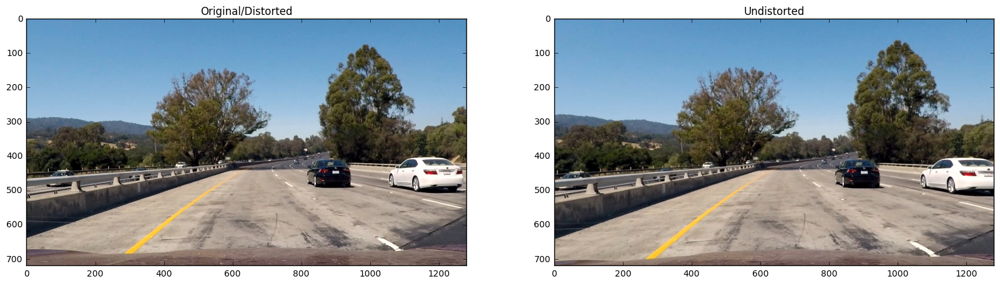

In [2]:
import cv2
image = cv2.imread('./test_images/test1.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
camera_calibrator.test_undistort('./test_images/test1.jpg','test1.png',True)
undistort_img = camera_calibrator.undistort(image_rgb)

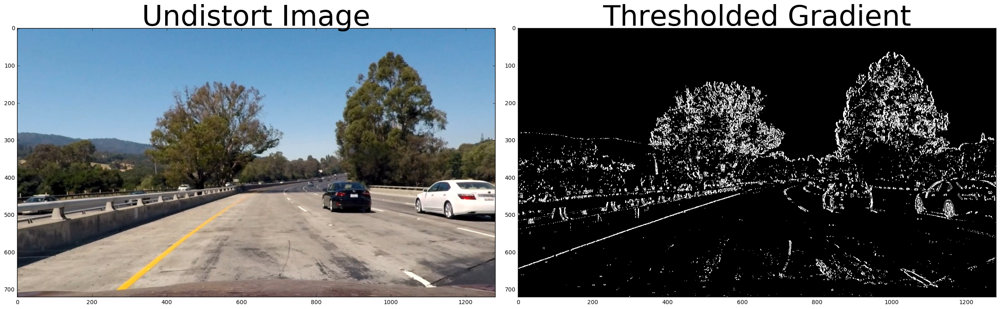

In [3]:
from lane_functions import *
import matplotlib.pyplot as plt
%matplotlib inline
# Run the function
grad_binary = abs_sobel_thresh(undistort_img, orient='x', thresh_min=20, thresh_max=100)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistort_img)
ax1.set_title('Undistort Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

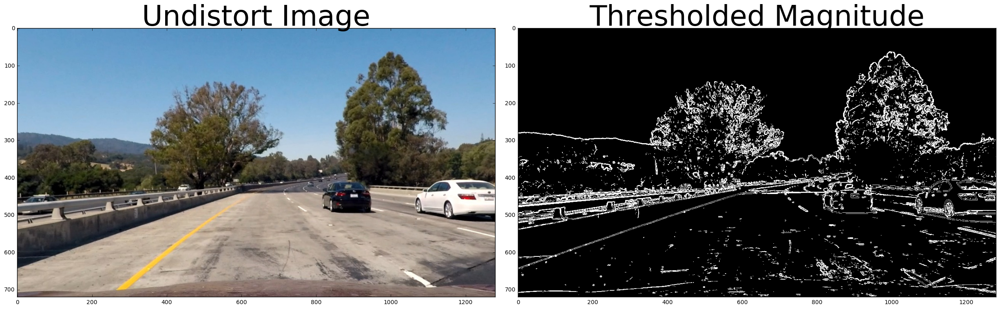

In [4]:
# Run the function
mag_binary = mag_thresh(undistort_img, sobel_kernel=3, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistort_img)
ax1.set_title('Undistort Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

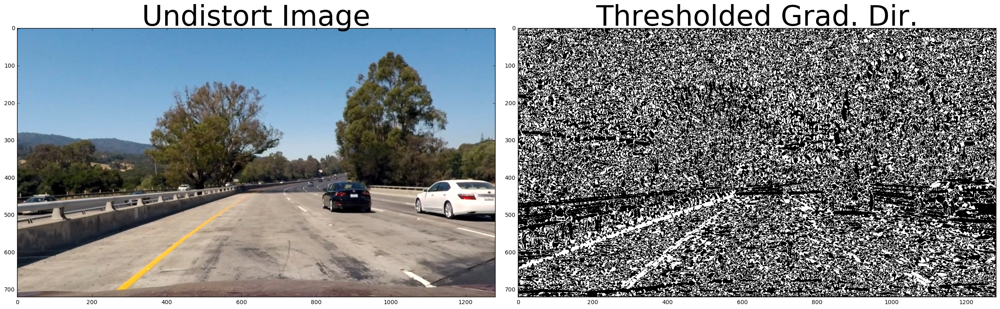

In [5]:
# Run the function
dir_binary = dir_threshold(undistort_img, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistort_img)
ax1.set_title('Undistort Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

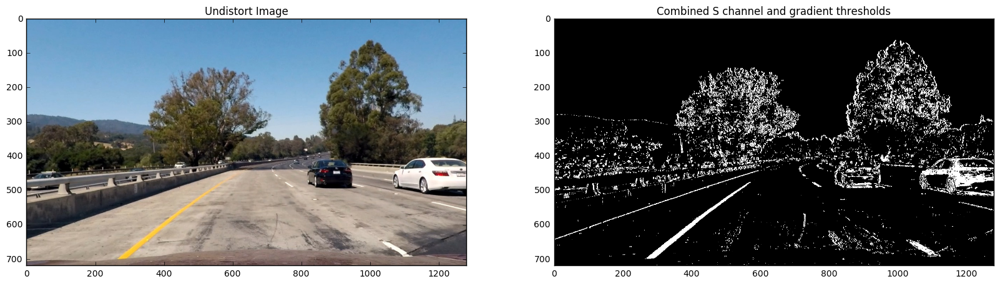

In [6]:
combined_image = combine_gradient(undistort_img)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Undistort Image')
ax1.imshow(undistort_img)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(combined_image, cmap='gray')

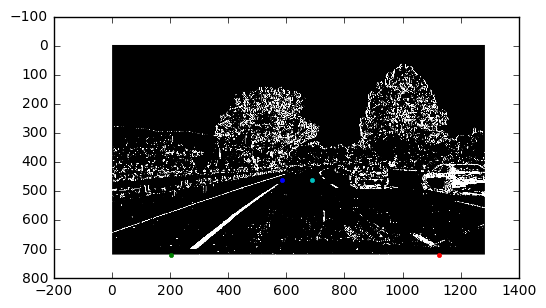

In [7]:
plt.imshow(combined_image,cmap='gray')
shape = combined_image.shape[::-1]
w = shape[0]
h = shape[1]
plt.plot(585, 460,'.')
plt.plot(203, 720,'.')
plt.plot(1127, 720,'.')
plt.plot(687, 460,'.')

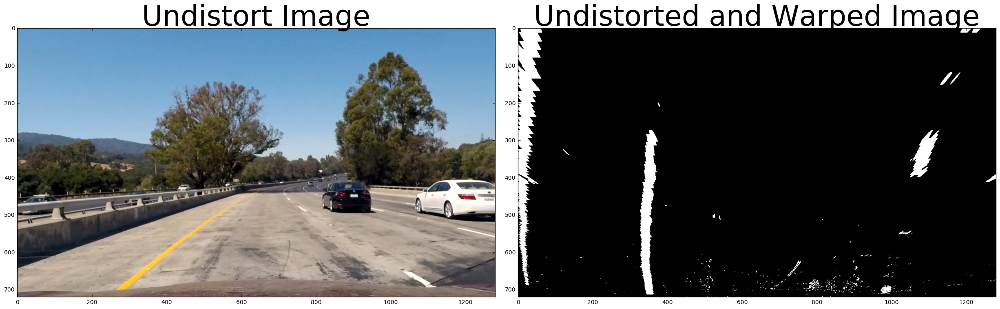

In [8]:
mtx, dist, rvecs, tvecs = camera_calibrator.get_data()
top_down, perspective_M = warp_perspective(combined_image,mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistort_img)
ax1.set_title('Undistort Image', fontsize=50)
ax2.imshow(top_down,cmap='gray')
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

(720, 0)

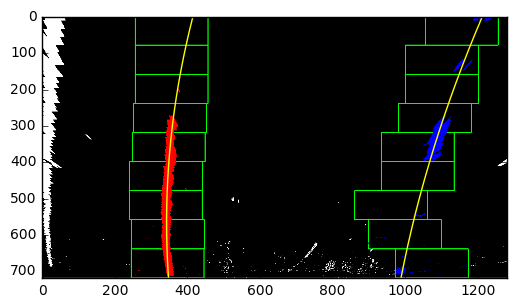

In [9]:
leftx_base,rightx_base,left_fit,right_fit,left_fitx,right_fitx,ploty,out_img  = polynomial(top_down)
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

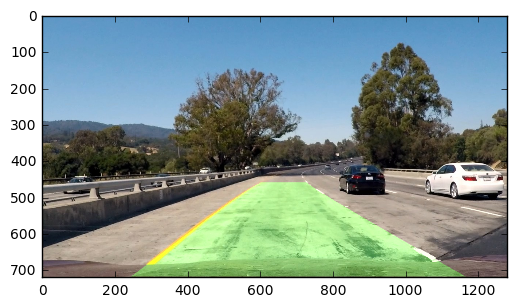

In [10]:
plot =  map_lane(top_down,image_rgb,perspective_M,left_fitx,right_fitx,ploty)
plt.imshow(plot)

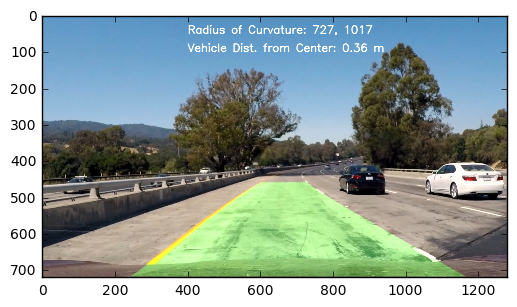

In [11]:
result = final_image(plot,leftx_base, left_fitx,rightx_base, right_fitx,ploty)
plt.imshow(result)

In [34]:
def process(image):
    rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    undistort_img = camera_calibrator.undistort(rgb_image)
    image_binary = combine_gradient(undistort_img)
    top_down, perspective_M = warp_perspective(image_binary,mtx, dist)
    leftx_base,rightx_base,left_fit,right_fit,left_fitx,right_fitx,ploty,out_img  = polynomial(top_down)
    plot =  map_lane(top_down,rgb_image,perspective_M,left_fitx,right_fitx,ploty)
    result = final_image(plot,leftx_base, left_fitx,rightx_base, right_fitx,ploty)
    return cv2.cvtColor(result, cv2.COLOR_RGB2BGR)

In [35]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    result = process(image)
    # you should return the final output (image where lines are drawn on lanes)
    return result

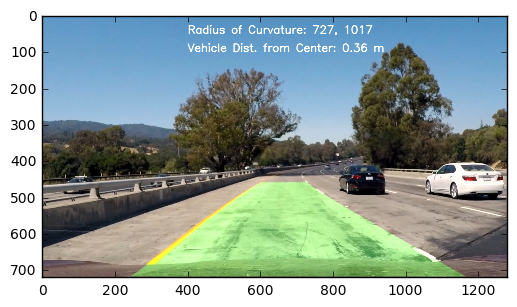

In [39]:
result = process_image(image)
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.imshow(result)
plt.savefig('./output_images/example_output.png')

In [40]:
white_output = 'test_videos_output/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/project_video.mp4
[MoviePy] Writing video test_videos_output/project_video.mp4


100%|█████████▉| 1260/1261 [02:11<00:00,  9.56it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video.mp4 

CPU times: user 2min 8s, sys: 30 s, total: 2min 38s
Wall time: 2min 13s


In [38]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))